<a href="https://colab.research.google.com/github/Padawanh/WIMyD/blob/main/Routing%20with%20Python%2C%20OSMnx%20and%20Taxicab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!apt install python3-rtree --quiet
!pip install osmnx
!pip instale matplotlib
!pip install ipyleaflet
!pip install taxicab
!pip install ipython-autotime
#!pip install basemap

In [1]:
#Essas para manipular os dados
import geopandas as gpd
from shapely.geometry import LineString, mapping
from shapely.ops import linemerge
import pandas as pd

#Essas para roteamento
import osmnx as ox
import taxicab as tc

#Essas para visualização
import matplotlib.pyplot as plt
from ipyleaflet import *
from ipyleaflet import Map, FullScreenControl
#from mpl_toolkits.basemap import Basemap

%matplotlib inline
%load_ext autotime

time: 393 µs (started: 2022-03-17 01:39:32 +00:00)


#Carregando os dados OSM

In [2]:
#Localização
location = (-20.819077,-51.8050747)
raio = 20000  #Em metros 
mode = "drive" #Modo de roteamento

#Pegas as informações de estradas OSM do raio especificado
G = ox.graph_from_point(location,dist=raio,simplify=True,network_type=mode) 

#Geodataframe dos nós e das vertices
nodes_proj, edges_proj = ox.graph_to_gdfs(G, nodes=True, edges=True)

time: 13.3 s (started: 2022-03-17 01:39:32 +00:00)


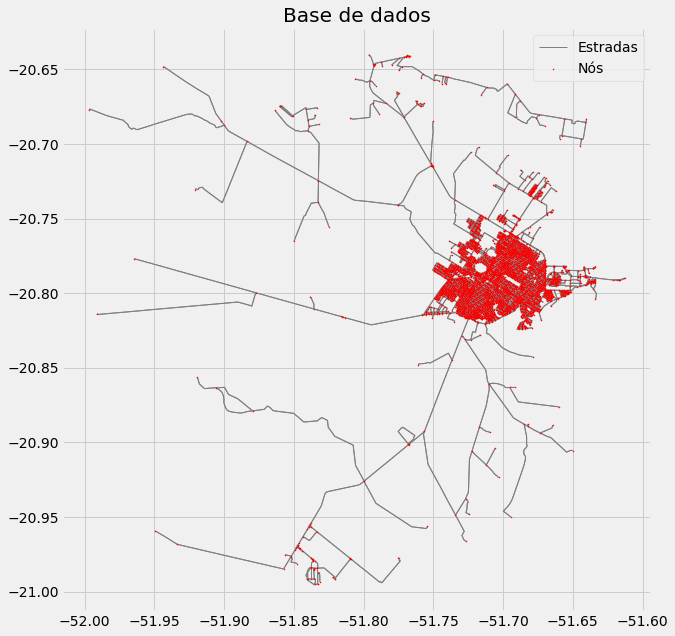

time: 8.32 s (started: 2022-03-17 01:41:03 +00:00)


In [13]:
plt.style.use('fivethirtyeight')
fig, ax = plt.subplots(figsize=(10,10))
plt.title('Base de dados')
edges_proj.plot(ax=ax , color='gray', linewidth=1, label='Estradas',zorder=1)
nodes_proj.plot(ax=ax , color='red',label='Nós',markersize=1,zorder=2)
plt.legend(loc='best')


#Roteando com a biblioteca Taxicab e OSMNX

A função `tc.distance.shortest_path` após receber pontos de origem e destino retorna uma lista com respectivamente;

* Distância em metros da rota
* Lista de nós
* geometria do começo da rota
* geometria do fim da rota


In [4]:
origin_point = (-20.797642,-51.8887437)
destination_point =(-20.813228, -51.730378)
route_tc = tc.distance.shortest_path(G, origin_point, destination_point)
route_tc

/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:288: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  dists = geoms.iloc[list(rtree.nearest(xy))].distance(Point(xy))
/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:288: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  dists = geoms.iloc[list(rtree.nearest(xy))].distance(Point(xy))


(17170.835204318228,
 [2056124967,
  8064997524,
  659255598,
  8064997510,
  659255595,
  6779243470,
  3745572730,
  8407909816,
  3745572735,
  8408294207,
  3530731468,
  8408051180,
  8408051194,
  8408051182,
  8393437831,
  7797821559,
  1701818476,
  1700512419,
  1700512418,
  1700512436,
  1701818475,
  1701818480,
  1701818481,
  1904990581],
 <shapely.geometry.linestring.LineString at 0x7f0889b829d0>)

time: 10.2 s (started: 2022-03-17 01:39:55 +00:00)


A biblioteca osmnx também tem uma função de distâncias porém considera os pontos de origem e destino os nós mais próximos. Basicamente a função `get_nearest_node` tem como retorno uma lista de nós assim como a função do taxicab `tc.distance.shortest_path`, porém sem os outros detalhamentos.

Inclusive foi essa falta de detalhamento uma das motivações do autor da biblioteca. [Segue o github do projeto.](https://github.com/nathanrooy/taxicab)

<img src="https://github.com/nathanrooy/taxicab/raw/main/docs/ex_03.jpg"/>

In [5]:
#Busca os nós mais próximos das coordenadas indicadas
origin_node = ox.get_nearest_node(G, origin_point)
destination_node = ox.get_nearest_node(G, destination_point)
#Busca a lista de nós entre os dois nós indicados
route_nodee = ox.shortest_path(G, origin_node,destination_node,weight='length') 
#Mostra lista de nós
route_nodee

/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


[2056124967,
 8064997524,
 659255598,
 8064997510,
 659255595,
 6779243470,
 3745572730,
 8407909816,
 3745572735,
 8408294207,
 3530731468,
 8408051180,
 8408051194,
 8408051182,
 8393437831,
 7797821559,
 1701818476,
 1700512419,
 1700512418,
 1700512436,
 1701818475,
 1701818480,
 1701818481,
 1904990581]

time: 60.8 ms (started: 2022-03-17 01:40:05 +00:00)


##Criando algumas funções

Para poder ver as geomeotrias montei uma função que dada uma lista de nós, retorna uma lista coordenadas que compões as linhas.

[Adaptei essa função do blog do Apurv Priyam](https://https://apurv.page/plotthepath.html)

In [6]:
def node_route(G, node_list):
    edge_nodes = list(zip(node_list[:-1], node_list[1:]))
    lines = []
    for u, v in edge_nodes:
        # se houver arestas paralelas, selecione o menor em comprimento
        data = min(G.get_edge_data(u, v).values(), key=lambda x: x['length'])

        # se tiver um atributo de geometria (ou seja, uma lista de segmentos de linha)
        if 'geometry' in data:
            # adicione-os à lista de linhas para plotar
            xs, ys = data['geometry'].xy
            lines.append(list(zip(xs, ys)))
        else:
            # se não tiver um atributo de geometria, a aresta é reta
            # linha de nó a nó
            x1 = G.nodes[u]['x']
            y1 = G.nodes[u]['y']
            x2 = G.nodes[v]['x']
            y2 = G.nodes[v]['y']
            line = [(x1, y1), (x2, y2)]
            lines.append(line)
    lat = []
    long = []
    for i in range(len(lines)):
        z = list(lines[i])
        l1 = list(list(zip(*z))[0])
        l2 = list(list(zip(*z))[1])
        for j in range(len(l1)):
            lat.append(l2[j])
            long.append(l1[j])
    df = pd.DataFrame({
     'Latitude': lat,
     'Longitude': long})
    gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude))
    return gdf
node_route(G,route_nodee)

,Latitude,Longitude,geometry
0,-20.799634,-51.877376,POINT (-51.87738 -20.79963)
1,-20.800594,-51.873724,POINT (-51.87372 -20.80059)
2,-20.800709,-51.873288,POINT (-51.87329 -20.80071)
3,-20.800838,-51.872797,POINT (-51.87280 -20.80084)
4,-20.800958,-51.872341,POINT (-51.87234 -20.80096)
...,...,...,...
99,-20.812509,-51.732447,POINT (-51.73245 -20.81251)
100,-20.812509,-51.732447,POINT (-51.73245 -20.81251)
101,-20.813009,-51.731649,POINT (-51.73165 -20.81301)
102,-20.813009,-51.731649,POINT (-51.73165 -20.81301)


time: 55.5 ms (started: 2022-03-17 01:40:05 +00:00)


Criando uma função para retornar os resultados da função `tc.distance.shortest_path` em uma geometria.

In [7]:
def routingTaxicab(G,origin_point,destination_point):
  route = tc.distance.shortest_path(G, origin_point, destination_point)
  shortest_path_points = node_route(G, route[1]) #Reutilizo a função que pega o GeoDataframe da lista de nós
  x = linemerge((LineString(shortest_path_points.geometry.values),route[2],route[3]))#Aqui junto todas a geometrias
  geo = gpd.GeoDataFrame([x], columns=['geometry'])#transformo em um GeoDataframe com a linha inteira
  dist = route[0]
  path = [dist,geo]
  return path


def routingOSMNX(G, edges, origin_point,destination_point):
  origin_node = ox.get_nearest_node(G, origin_point)
  destination_node = ox.get_nearest_node(G, destination_point)
  node_list = ox.shortest_path(G, origin_node,destination_node ,weight='length')
  route_node1 = node_route(G,node_list)
  geo = gpd.GeoDataFrame([LineString(route_node1.geometry.values)], columns=['geometry'])#transformo em um GeoDataframe com a linha inteira

  x = 0
  edges_proje = edges.reset_index()
  for i in range(len(node_list)):
    if node_list[i] == node_list[-1]:
      break
    else:
      y = edges_proje['length'][edges_proje['u']==node_list[i]][edges_proje['v']==node_list[i+1]]
      x = x+y.values[0]
      output = [x,geo]
  return output

time: 24.5 ms (started: 2022-03-17 01:40:05 +00:00)


##Comparando Taxicab e OSMNX

In [8]:
#Rota Taxicab
route_Taxicab = routingTaxicab(G,origin_point,destination_point)
#Rota OSMNX
route_OSMNX = routingOSMNX(G,edges_proj ,origin_point,destination_point)

/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:288: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  dists = geoms.iloc[list(rtree.nearest(xy))].distance(Point(xy))


time: 6.82 s (started: 2022-03-17 01:40:05 +00:00)


/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:288: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  dists = geoms.iloc[list(rtree.nearest(xy))].distance(Point(xy))
/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


In [9]:
print("Distância de " + str(round(route_Taxicab[0]/1000,1)) + " KM no Taxicab e "+ str(round(route_OSMNX[0]/1000,1)) + " KM no OSMNX")

Distância de 17.2 KM no Taxicab e 15.9 KM no OSMNX
time: 2.86 ms (started: 2022-03-17 01:40:12 +00:00)


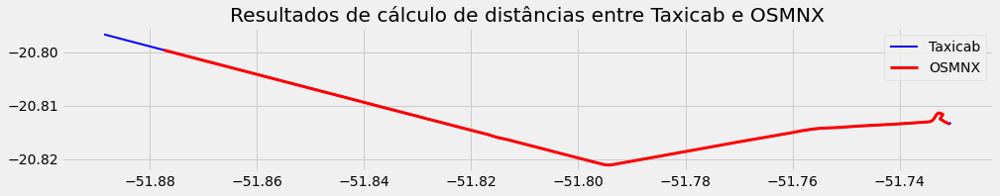

time: 304 ms (started: 2022-03-17 01:40:12 +00:00)


In [10]:
fig, ax = plt.subplots(figsize=(15, 6))
plt.title('Resultados de cálculo de distâncias entre Taxicab e OSMNX')
route_Taxicab[1].plot(ax=ax , color='blue', linewidth=2, label='Taxicab')
route_OSMNX[1].plot(ax=ax , color='red',label='OSMNX',linewidth=3)
plt.legend(loc='best')

#Mapa dinâmico

Criando uma função  que calcula a rota e mostra ela dinamicamente a partir dos marcadores do leaflet.

[Adaptei essa função do post do Talles Felix](https://medium.com/analytics-vidhya/interative-map-with-osm-directions-and-networkx-582c4f3435bc)

In [11]:
path_layer_list = []
def handle_change_location(event, marker,G):
    """
    Considerando os marcadores do leaflet calcula a distâncias entre eles e retorna a linha da rota no mapa
    """
    event_owner = event['owner']

    path = routingTaxicab(G,event_owner.location,marker.location)
    
    if len(path_layer_list) == 1:
      m.remove_layer(path_layer_list[0])
      path_layer_list.pop()

    path_layer = GeoData(geo_dataframe=path[1], style={'color':'blue', 'weight':4})

    m.add_layer(path_layer)
    path_layer_list.append(path_layer)

#Mapa dinâmico

#Estilo para o marcador de destino
to_marker_style = AwesomeIcon( name='circle', icon_color='white', marker_color='red', spin=False )

#Criando marcadores
from_marker = Marker(location=origin_point)
to_marker = Marker(location=destination_point, icon=to_marker_style)
#Acionando as funções de calculo de rota
from_marker.observe(lambda event: handle_change_location(event, to_marker,G), 'location')
to_marker.observe(lambda event: handle_change_location(event, from_marker,G), 'location')

#Criando mapa
m = Map(center=location, basemap=basemaps.OpenStreetMap.Mapnik, zoom=11)

#m.add_layer(GeoData(geo_dataframe=nodes_proj,point_style={'color': 'red','weight':2,'radius': 0})) #adiciona os nós no mapa
m.add_layer(from_marker)
m.add_layer(to_marker)
m.add_layer(GeoData(geo_dataframe=edges_proj,style={'color':'black', 'weight':0.5}))
m.add_control(FullScreenControl())
m

Map(center=[-20.819077, -51.8050747], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_titl…

time: 7.67 s (started: 2022-03-17 01:40:12 +00:00)


/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:288: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  dists = geoms.iloc[list(rtree.nearest(xy))].distance(Point(xy))
/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:288: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  dists = geoms.iloc[list(rtree.nearest(xy))].distance(Point(xy))
/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:288: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  dists = geoms.iloc[list(rtree.nearest(xy))].distance(Point(xy))
/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:288:

#Outros testes

In [ ]:
type_edges_proj = edges_proj.reset_index()
a = type_edges_proj['highway'].drop_duplicates()
a

0                            primary
8                       unclassified
9                           tertiary
32                      primary_link
227                            trunk
257                      residential
357                       trunk_link
423                         motorway
446                        secondary
1990                   tertiary_link
9819                   living_street
11680                 secondary_link
13923    [unclassified, residential]
15009    [residential, unclassified]
Name: highway, dtype: object

time: 18.3 ms (started: 2022-03-14 01:36:58 +00:00)
